# Compound Events

In [1]:
# Imports
import os
import pandas as pd
import warnings
import numpy as np
import matplotlib.pyplot as plt
import operator
import seaborn as sns
from collections import defaultdict

# Suppress warnings
warnings.filterwarnings('ignore')

# Configure matplotlib
plt.rcParams['figure.figsize'] = (15, 4)
plt.rcParams['figure.dpi'] = 600
plt.rcParams['font.size'] = 10
plt.rcParams['figure.titlesize'] = 15
plt.rcParams['axes.linewidth'] = 0.1
plt.rcParams['patch.linewidth'] = 0
plt.rcParams['grid.linewidth'] = 0.1  

# Initialization

In [2]:
# filename format: CENTER_var_scenario_stat.csv

path = center = 'LARC' # Data directory
months = [6, 7, 8] # Dry months (June, July, August)
month_title = '(JJA)'
temporal_res = ['daily', 'monthly_avg', 'annual_avg'][0] # Temporal resolution 
variables = ['pr_', 'tasmax_']
hist = (1961, 1990) # Historical range
centers = ['AMES', 'GSFC', 'JPL', 'KSC', 'MSFC', 'MAF', 'GISS',
           'LARC', 'SSC', 'GRC', 'WFF', 'JSC', 'WSTF', 'AFRC']
percentiles = {
    'pr': ['<', 0.5], # 50th percentile for precipitation
    'tasmax': ['>', 0.9] # 90th percentile for maximum temperature
}

# Comparative operators
comp_ops = {
    '<': operator.lt,
    '<=': operator.le,
    '>': operator.gt,
    '>=': operator.ge,
    # '==': operator.eq,
    # '!=': operator.ne
    }

# Preprocess Data

In [3]:
def get_files(path: str, center: str, variables: list = None):
    '''
    Returns list of filenames in a directory that contain a specific string.

    Args:
        path: the path to the data directory to search
        center: the NASA center name in the filename
        variables: optional list of variables to filter files (default: None)
    '''
    return [os.path.join(path, f) for f in os.listdir(path) 
            if center in f and f.endswith('.csv') and any(v in f for v in variables)]


def preprocess_file(filename: str, is_hist: bool, percentiles:dict):
    '''
    Returns preprocessed pandas DataFrame based on CSV file type (historical or SSP)
    
    Args:
        filename: Path to the CSV file
        is_hist: Boolean indicating whether the file is historical (True) or SSP (False)
    
    Returns:
        - If historical: Processed DataFrame
        - If SSP: (variable name, processed DataFrame)
    '''
    name = filename[:-4].split('_')  # Extract variable name
    
    df = pd.read_csv(filename).rename(columns={'Unnamed: 0': 'date'})
    df['date'] = pd.to_datetime(df['date'])
    df = df.set_index('date')
    
    if name[1] in ['pr']:
        # Calculate monthly mean per year while keeping original df dimensions
        df = df.groupby(df.index.strftime('%Y-%m')).transform('mean')
    
    # Convert Kelvin to Celsius for temperature data
    if name[1] in ['tasmax', 'tas']:
        df = df - 273.15

    if is_hist:
        # Calculate percentiles for each model
        op, p = percentiles[name[1]]
        df = df[(hist[0] <= df.index.year) & (df.index.year <= hist[1])]
        df = df.groupby(df.index.strftime('%Y-%m')).mean()
        return pd.DataFrame({f'{name[1]}_{op}_{p}': df.quantile(p)})
    else: 
        df = df[df.index.month.isin(months)]        
        return ('_'.join(name[1:3]), df.add_suffix(f'_{name[1]}'))

def add_compound_flag(hist_df:pd.DataFrame, ssp_df:pd.DataFrame, percentiles:dict):
    '''
    Returns SSP dataframe with added compound flag based on historical percentiles
    
    Args:
        hist_df: Historical DataFrame
        ssp_df: SSP DataFrame
    '''
    for model in hist_df.index:
        flag = []
        for var, (op, p) in percentiles.items():
            # Check if ssp values exceed historical percentiles
            perc = hist_df[f'{var}_{op}_{p}'].loc[model]
            ssp_values = ssp_df[f'{model}_{var}'].to_list()
            
            # Apply the comparison function
            ssp_df[f'{model}_{var}_{op}_{p}'] = comp_ops[op](ssp_values, perc)
            flag.append(ssp_df[f'{model}_{var}_{op}_{p}'].to_list())
        
            # Calculate diff
            ssp_df[f'{model}_{var}_diff'] = ssp_df[f'{model}_{var}'] - perc
        
        ssp_df[f'{model}_compound'] = np.all(flag, axis=0)
    return ssp_df

def process_data(files, percentiles):
    """
    Process historical and SSP climate data files.
    
    Args:
    files (dict): Dictionary containing 'historical' and 'ssp' file lists
    percentiles (dict): Dictionary of percentile thresholds for each variable
    
    Returns:
    tuple: (hist_df, ssp_dfs) where hist_df is the historical DataFrame and 
           ssp_dfs is a dictionary of SSP DataFrames
    """
    # Process historical files and merge into a single DataFrame
    hist_df = pd.concat([preprocess_file(f, True, percentiles) 
                         for f in files['historical']], axis=1).dropna()

    # Process SSP files and store in a dictionary
    ssp_dfs = {name: df for name, df in (preprocess_file(f, False, percentiles) 
                                         for f in files['ssp'])}

    # Merge all SSP data from the same scenario
    grouped_data = defaultdict(list)
    for key, df in ssp_dfs.items():
        grouped_data[key.split('_')[-1]].append(df)

    # Add flag to indicate compound events    
    ssp_dfs = {ssp: add_compound_flag(hist_df, pd.concat(dfs, axis=1), percentiles) 
               for ssp, dfs in grouped_data.items()}
    
    return hist_df, ssp_dfs


In [4]:
# Get files for a center
files = sorted([f for f in get_files(path, center, variables) if temporal_res in f])
files = {key: [f for f in files if key in f] for key in ['historical', 'ssp']}
print(f'{len(files['historical']) + len(files['ssp'])} {center} files')
display(files)

hist_df, ssp_dfs = process_data(files, percentiles)

# # Dataframe column number check
# if ssp_dfs['ssp245'].shape[1] + len(hist_df) != ssp_dfs['ssp245'].shape[1]:
#     raise ValueError('Number of flag columns is incorrect')

print(f'\nHistorical percentiles: {len(hist_df)} models used')
display(hist_df.head(2))
print(f'SSP {temporal_res.title()} Data')
print(ssp_dfs.keys())
# display(ssp_dfs['ssp245'].head(2))
print('\nAdded Compound Flag')
display(ssp_dfs['ssp245'].head(2))

8 LARC files


{'historical': ['LARC/LARC_pr_historical_daily.csv',
  'LARC/LARC_tasmax_historical_daily.csv'],
 'ssp': ['LARC/LARC_pr_ssp126_daily.csv',
  'LARC/LARC_pr_ssp245_daily.csv',
  'LARC/LARC_pr_ssp370_daily.csv',
  'LARC/LARC_tasmax_ssp126_daily.csv',
  'LARC/LARC_tasmax_ssp245_daily.csv',
  'LARC/LARC_tasmax_ssp370_daily.csv']}


Historical percentiles: 21 models used


,pr_<_0.5,tasmax_>_0.9
INM-CM4-8,0.000036,30.373966
INM-CM5-0,0.000036,30.351364


SSP Daily Data
dict_keys(['ssp126', 'ssp245', 'ssp370'])

Added Compound Flag


,INM-CM4-8_pr,INM-CM5-0_pr,NorESM2-MM_pr,NorESM2-LM_pr,MIROC6_pr,GFDL-ESM4_pr,MIROC-ES2L_pr,GISS-E2-1-G_pr,FGOALS-g3_pr,MPI-ESM1-2-HR_pr,...,CNRM-CM6-1_pr_<_0.5,CNRM-CM6-1_pr_diff,CNRM-CM6-1_tasmax_>_0.9,CNRM-CM6-1_tasmax_diff,CNRM-CM6-1_compound,KACE-1-0-G_pr_<_0.5,KACE-1-0-G_pr_diff,KACE-1-0-G_tasmax_>_0.9,KACE-1-0-G_tasmax_diff,KACE-1-0-G_compound
date,,,,,,,,,,,,,,,,,,,,,
2015-06-01,0.000047,0.000056,0.000038,0.000052,0.000034,0.000043,0.000047,0.000032,0.00003,0.000043,...,False,0.000004,False,-5.282323,False,False,0.000002,True,1.390501,False
2015-06-02,0.000047,0.000056,0.000038,0.000052,0.000034,0.000043,0.000047,0.000032,0.00003,0.000043,...,False,0.000004,False,-6.377073,False,False,0.000002,True,2.904082,False


## Check

In [5]:
m = 'INM-CM4-8'
aa = ssp_dfs['ssp245'].filter(regex=m)#.sum()
display(hist_df.loc[m])
display(aa[aa[f'{m}_compound']==True]#[aa[f'{m}_tasmax_>_0.9']==False]
        .head(5))

pr_<_0.5         0.000036
tasmax_>_0.9    30.373966
Name: INM-CM4-8, dtype: float64

,INM-CM4-8_pr,INM-CM4-8_tasmax,INM-CM4-8_pr_<_0.5,INM-CM4-8_pr_diff,INM-CM4-8_tasmax_>_0.9,INM-CM4-8_tasmax_diff,INM-CM4-8_compound
date,,,,,,,
2017-07-06,0.000031,32.343103,True,-0.000005,True,1.969137,True
2017-07-07,0.000031,32.779413,True,-0.000005,True,2.405447,True
2017-07-08,0.000031,35.188318,True,-0.000005,True,4.814352,True
2017-07-09,0.000031,36.040735,True,-0.000005,True,5.666769,True
2017-07-10,0.000031,37.428766,True,-0.000005,True,7.054800,True


# Analysis

In [6]:
# def plot_distribution(df, model, title_var, show_models=False):
#     sns.kdeplot(data=df.mean(axis=1), label=f'{model}_mean', linewidth=0.5, alpha=0.7)
#     sns.kdeplot(data=df.median(axis=1), label=f'{model}_median', linewidth=0.5, alpha=0.7)
#     if show_models:
#         for col in df.columns:
#             sns.kdeplot(data=df, x=col, #label=col.split('_')[0],
#                         color='grey', linewidth=0.2, alpha=0.4)

#     plt.title(f'Distribution: {title_var} Per (Month, Year) Across CMIP6 Models')
#     plt.xlabel(title_var)
#     plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
#     # plt.show()

# def plot_ts(df, model, title_var, show_models=False, avg=True, med=True):    
#     if avg: # show mean
#         sns.lineplot(data=df.mean(axis=1), label=f'{model}_mean', linewidth=0.5, alpha=0.5)
#     if med: # show median
#         sns.lineplot(data=df.median(axis=1), label=f'{model}_median', linewidth=0.5, alpha=0.5)
        
#     if show_models:
#         for col in df.columns:
#             sns.lineplot(data=df, x=df.index, y=col, #label=col.split('_')[0],
#                          color='grey', linewidth=0.2, alpha=0.4)

#     plt.title(f'TS: {title_var} Per Year Across CMIP6 Models')
#     plt.xlabel('Year')
#     plt.ylabel(title_var)
#     plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
#     # plt.show()

# def plot_all(dfs_dict, title):
#     # Distribution
#     for m, df in dfs_dict.items():
#         plot_distribution(df, m, title)
#     plt.show()

#     # Time Series
#     # Mean + Median
#     for m, df in dfs_dict.items():
#         plot_ts(df, m, title)
#     plt.grid()
#     plt.show()

#     # Mean
#     for m, df in dfs_dict.items():
#         plot_ts(df, m, title, show_models=False, avg=True, med=False)
#     plt.grid()
#     plt.show()

#     # Median
#     for m, df in dfs_dict.items():
#         plot_ts(df, m, title, show_models=False, avg=False, med=True)
#     plt.grid()
#     plt.show()

In [7]:
# SETUP DATAFRAMES

# def filter_non_zero(group):
#     return group[group > 0].tolist()
    
def count_consecutive_true(df):
    # Identify changes in boolean values
    changes = df.ne(df.shift())
    # Create groups for consecutive values
    groups = changes.cumsum()
    # Count consecutive True values
    counts = df.groupby(groups).cumsum()
    # return counts.groupby(df.index.year).apply(filter_non_zero)
    
    # only considers #(days) > 0
    return counts.replace(0, np.nan).groupby(df.index.year).agg('max')

def get_data(dfs:dict, suffix:str, agg:str, duration:bool=False):
    dict_df = {}
    for m, df in dfs.items():
        df_ = df.filter(regex=suffix)
        if duration:
            df_ = df_.apply(count_consecutive_true)
        df_.index = pd.to_datetime(df_.index, format='%Y')
        df_ = df_.groupby(df_.index.year).agg(agg)
        dict_df[m] = df_
    return dict_df

# PLOTTING
def plot_dist(df_dict, title_var, agg='mean', alpha=1):
    # Distribution
    for m, df in df_dict.items():
        sns.kdeplot(data=df.agg(agg, axis=1), label=f'{m}_{agg}', 
                    linewidth=0.5, alpha=alpha)
        
        # if show_models:
        #     for col in df.columns:
        #         sns.kdeplot(data=df, x=col, #label=col.split('_')[0],
        #                     color='grey', linewidth=0.2, alpha=0.4)

        plt.title(f'{title_var} Per Year {month_title} Across CMIP6 Models')
        plt.xlabel(title_var)
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()

def plot_ts(df_dict, title_var, agg='mean', alpha=1):
    # Time Series
    for m, df in df_dict.items():

        sns.lineplot(data=df.agg(agg, axis=1), label=f'{m}_{agg}', 
                    linewidth=0.5, alpha=alpha)
    plt.title(f'{title_var} Per Year {month_title} Across CMIP6 Models')
    plt.xlabel('Year')
    plt.ylabel(title_var)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()
    

def plot_all(df_dict, title_var, agg='mean', alpha=1):
    plot_dist(df_dict, title_var, agg, alpha)
    
    plot_ts(df_dict, title_var, agg, alpha)

## Trends

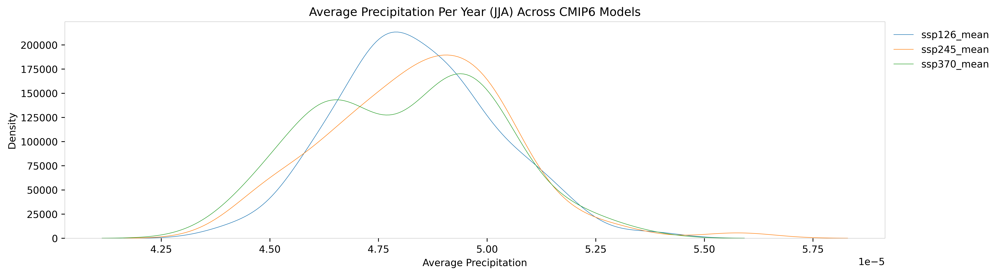

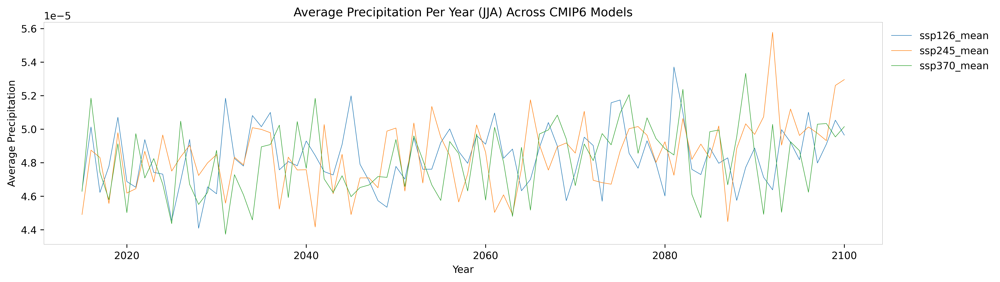

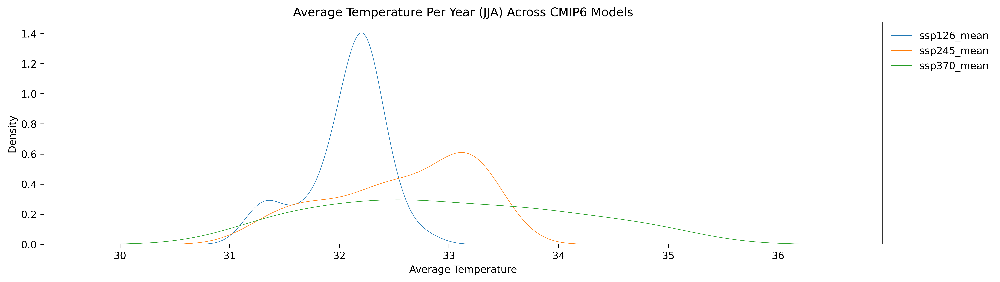

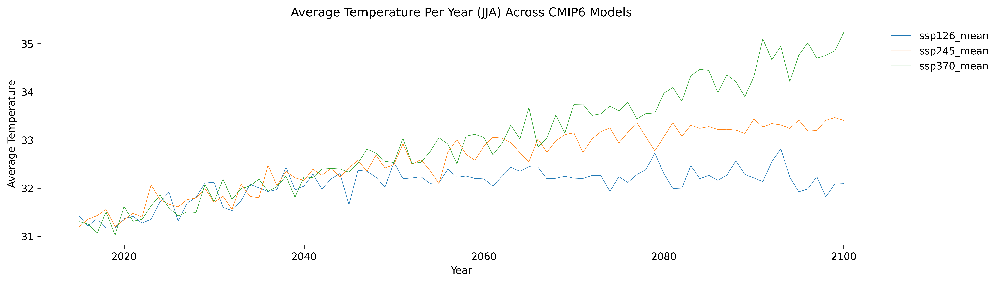

In [8]:
# Average Precipitation
pr = get_data(ssp_dfs, f'_pr$', 'mean')
plot_all(pr, 'Average Precipitation', agg='mean')

# Average temperature
tm = get_data(ssp_dfs, f'_tasmax$', 'mean')
plot_all(tm, 'Average Temperature', agg='mean')

## Frequency

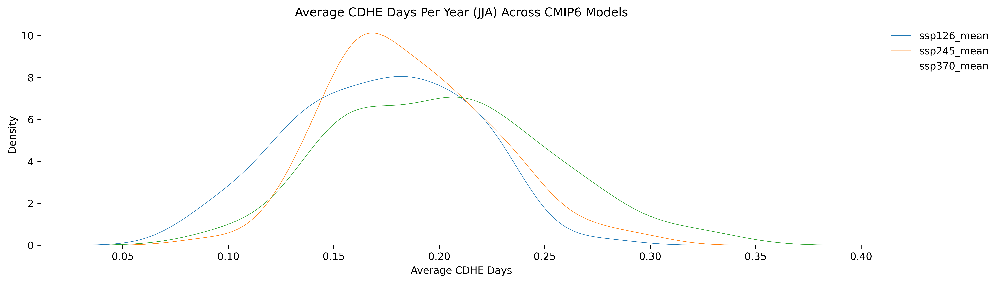

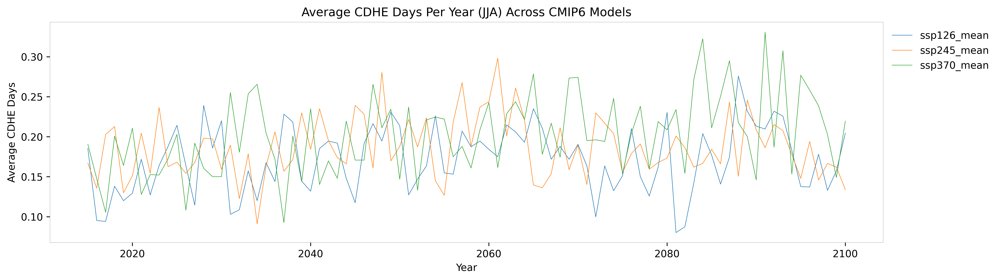

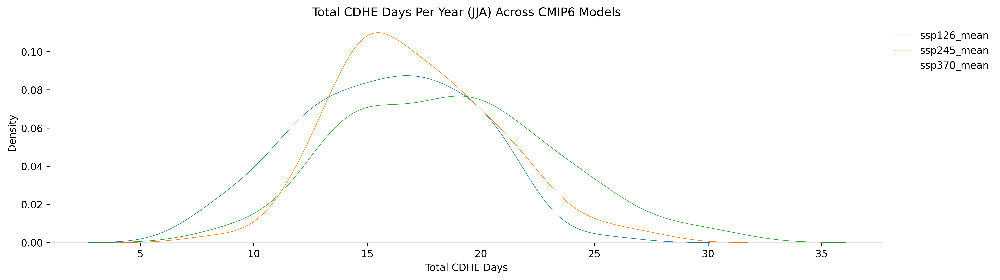

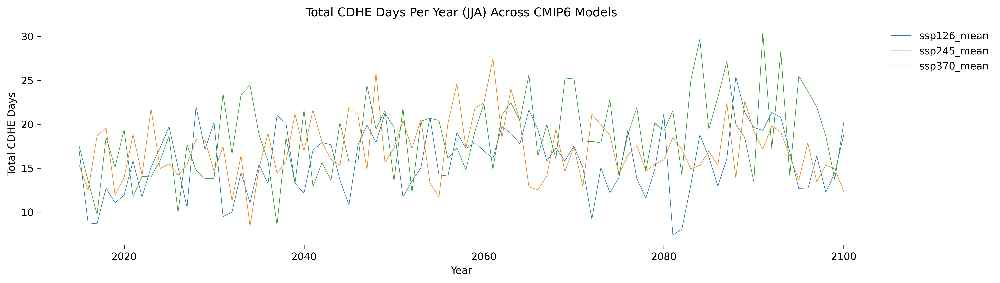

In [9]:
# Average Compound Days
comp_avg = get_data(ssp_dfs, f'_compound$', 'mean')
plot_all(comp_avg, 'Average CDHE Days', agg='mean')

# Total Compound Days
comp_sum = get_data(ssp_dfs, f'_compound$', 'sum')
plot_all(comp_sum, 'Total CDHE Days', agg='mean')

In [10]:
comp_sum['ssp126'].describe().T.sort_values('max')

,count,mean,std,min,25%,50%,75%,max
NorESM2-MM_compound,86.0,15.534884,14.743850,0.0,0.0,14.5,23.75,49.0
MPI-ESM1-2-LR_compound,86.0,11.965116,13.504202,0.0,0.0,13.0,19.75,51.0
ACCESS-CM2_compound,86.0,16.337209,14.997734,0.0,0.0,17.5,26.00,52.0
KACE-1-0-G_compound,86.0,11.872093,13.929906,0.0,0.0,0.0,23.00,53.0
CMCC-ESM2_compound,86.0,9.790698,13.029484,0.0,0.0,0.0,19.00,54.0
MIROC6_compound,86.0,14.000000,15.006665,0.0,0.0,15.0,23.75,55.0
FGOALS-g3_compound,86.0,13.232558,13.747021,0.0,0.0,13.0,20.00,55.0
INM-CM5-0_compound,86.0,13.186047,15.863025,0.0,0.0,4.5,23.75,57.0
NorESM2-LM_compound,86.0,16.418605,17.730973,0.0,0.0,16.0,25.75,57.0
MRI-ESM2-0_compound,86.0,10.872093,13.092249,0.0,0.0,9.5,19.00,58.0


## Duration 

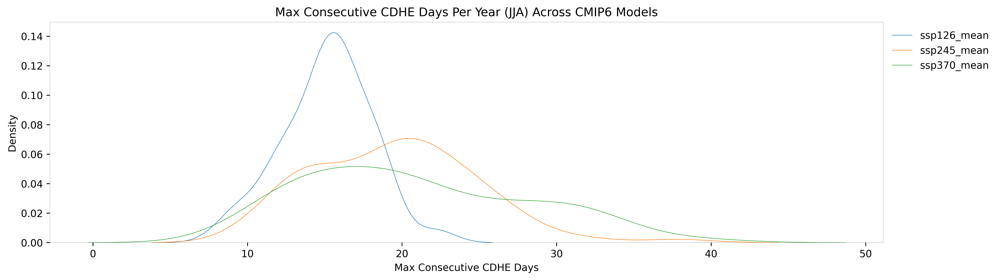

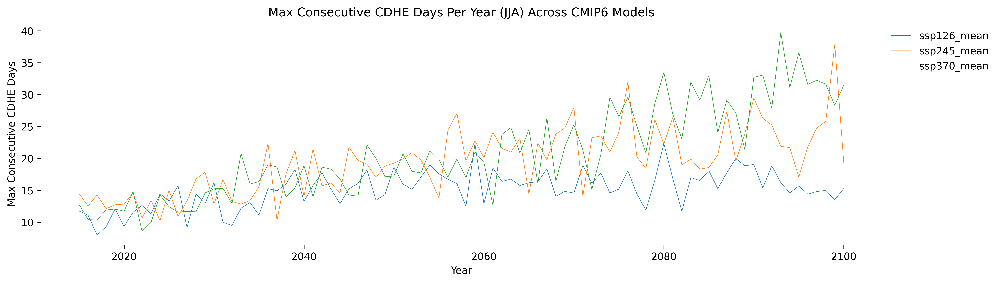

In [11]:
# Max Consecutive Days
duration = get_data(ssp_dfs, f'_compound$', 'mean', True)
plot_all(duration, 'Max Consecutive CDHE Days', agg='mean')

# Threshold Comparison

In [12]:
thresholds = [
    {'pr': ['<', 0.5], 'tasmax': ['>', 0.75]},
    {'pr': ['<', 0.4], 'tasmax': ['>', 0.80]},
    {'pr': ['<', 0.3], 'tasmax': ['>', 0.85]},
    {'pr': ['<', 0.2], 'tasmax': ['>', 0.90]},
    {'pr': ['<', 0.1], 'tasmax': ['>', 0.95]},
]

thres_dfs = {}
for threshold in thresholds:
    name = '_'.join([f'{v}{c}{p}' for v, (c, p) in threshold.items()])
    thres_dfs[name] = process_data(files, threshold)[1]

# Total Compound Days
comp_thres_dfs = {}
dura_thres_dfs = {}
for threshold, dfs in thres_dfs.items():
    comp_thres_dfs[threshold] = get_data(dfs, f'_compound$', 'sum', False)
    dura_thres_dfs[threshold] = get_data(dfs, f'_compound$', 'mean', True)

In [13]:
def plot_ts_subplots(comp_thres_dfs, title_var, agg='mean', alpha=1):
    ssps = list(comp_thres_dfs[list(comp_thres_dfs.keys())[0]].keys())
    colors = plt.cm.tab10.colors

    fig, axes = plt.subplots(3, 1, figsize=(15, 10), sharex=True, sharey=True)
    fig.suptitle(f'{title_var} Per Year Across CMIP6 Models', fontsize=16, y=0.95)

    lines = []
    labels = []

    for i, ssp in enumerate(ssps):
        ax = axes[i]
        for j, (threshold, dfs) in enumerate(comp_thres_dfs.items()):
            df = dfs[ssp]
            line = sns.lineplot(x=df.index, y=df.agg(agg, axis=1), label=threshold,
                                color=colors[j % len(colors)], linewidth=0.8,
                                alpha=alpha, ax=ax)
            if i == 0:
                lines.append(line.lines[-1])
                labels.append(threshold)

        ax.set_title(ssp)
        ax.grid(True, color='lightgrey', linewidth=0.1)
        
        if i == 1:
            ax.set_ylabel(title_var)
        else:
            ax.set_ylabel('')
        
        if i == 2:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        
        ax.legend().remove()

    fig.legend(lines, labels, title='Thresholds', bbox_to_anchor=(0.5, 0.88), 
               loc='lower center', ncol=len(comp_thres_dfs), frameon=False)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

plot_ts_subplots(comp_thres_dfs, 'Total CDHE Days', agg='mean')
plot_ts_subplots(dura_thres_dfs, 'Max Consecutive CDHE Days', agg='mean')
